In [1]:
from matplotlib import pyplot as plt
import numpy as np
from figure import _plot_eeg, plot_eeg
from eeg_v2 import EEG
from utils import chunks, baseline_calc, butter_bandpass_filter

plt.rcParams["figure.figsize"] = [10, 5]

In [2]:
# Reading raw data
path_edf="./edf/1578_alice/edf/A0001578.edf"
path_stage="./edf/1578_alice/csv/STAGE.csv"

eeg = EEG(path_edf=path_edf, path_stage=path_stage)

/home/tudo/Desktop/code/ica_paper/eeg_v2.py:17: RuntimeWarning: Channel names are not unique, found duplicates for: {'EMG Chin'}. Applying running numbers for duplicates.
  raw = read_raw_edf(self.path_edf, preload=True, verbose=0)


In [3]:
def get_chunks(sig):
    i = 0
    for task in sig.tasks:
        for c in chunks(task, 15):
            i+=1
            yield i, c

In [4]:
_chunks = get_chunks(eeg)
for i in range(16):
    _, chunk = next(_chunks)

print(_)
print(np.min(chunk),np.max(chunk))

# Preprocessing
sample_raw = eeg.raw.copy().crop(np.min(chunk),np.max(chunk),include_tmax=False)
sample_raw_eog = eeg.eog_channels.copy().crop(np.min(chunk),np.max(chunk),include_tmax=False)


# Baseline
sample_raw_baseline = sample_raw.copy()
sample_raw_baseline = sample_raw_baseline.apply_function(baseline_calc)

# Bandpass
sample_raw_bandpass = sample_raw_baseline.copy()
sample_raw_bandpass = sample_raw_bandpass.apply_function(butter_bandpass_filter)

16
2416 2431


In [5]:
# Raw data
_raw = np.zeros([12, 7500])
_raw[0:10,:] = sample_raw.get_data()
_raw[10:12,:] = sample_raw_eog.get_data()

# Bandpass data
_bandpass = np.zeros([12, 7500])
_bandpass[0:10,:] = sample_raw_bandpass.get_data()
_bandpass[10:12,:] = sample_raw_eog.get_data()

# FIGURE 2

In [33]:
plt.rcParams["figure.figsize"] = [10,10]
_plot_eeg(_raw*1e6, fs=500, ch_names = [*sample_raw.ch_names, *sample_raw_eog.ch_names]
         , markers=[
    {"t":1,"c":"black"},
    {"t":1.7,"c":"black"},
    {"t":2.45,"c":"black"},
    {"t":3.6,"c":"black"},
    {"t":6,"c":"black"},
    {"t":6.9,"c":"black"},
    {"t":8.6,"c":"black"},
    {"t":12.5,"c":"black"},]
         ,dpi = 1200
         );

In [34]:
_plot_eeg(
    _bandpass*1e6, 
    
    fs=500, 
    
    ch_names = [*sample_raw.ch_names, *sample_raw_eog.ch_names], 

    markers=[
    {"t":1,"c":"black"},
    {"t":1.7,"c":"black"},
    {"t":2.45,"c":"black"},
    {"t":3.6,"c":"black"},
    {"t":6,"c":"black"},
    {"t":6.9,"c":"black"},
    {"t":8.6,"c":"black"},
    {"t":12.5,"c":"black"},],
    
    dpi = 1200
);

# FIGURE 3

In [10]:
import joblib
from mne.preprocessing import ICA

In [8]:
clf = joblib.load("./models/eog_classifier_v2.joblib")

In [12]:
def _get_ica_map(ica, components=None):
    """Get ICA topomap for components"""
    fast_dot = np.dot
    if components is None:
        components = list(range(ica.n_components_))
    maps = fast_dot(ica.mixing_matrix_[:, components].T,
                    ica.pca_components_[:ica.n_components_])
    return maps

In [17]:
sample_raw_train = sample_raw_bandpass.copy()
sample_raw_corrected = sample_raw_bandpass.copy()

# Fitting ICA
ica = ICA(method="extended-infomax", random_state=1)
ica.fit(sample_raw_corrected)

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-17-9deec753053e>:5: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 2.1s.


<ICA  |  raw data decomposition, fit (infomax): 7500 samples, 10 components, channels used: "eeg">

In [18]:
maps = _get_ica_map(ica).T
scalings = np.linalg.norm(maps, axis=0)
maps /= scalings[None, :]
X = maps.T

# Predict EOG
eog_preds = clf.predict(X)
list_of_eog = np.where(eog_preds == 1)[0]

In [19]:
list_of_eog

array([0, 3])

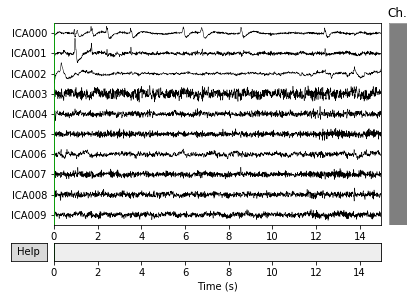

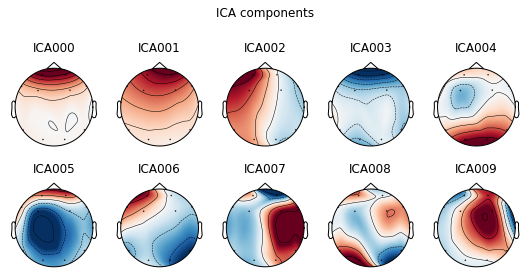

[<Figure size 540x288 with 10 Axes>]

In [21]:
ica.plot_sources(inst=sample_raw_train) 
ica.plot_components(inst=sample_raw_train)

In [23]:
ica.exclude = list_of_eog
ica.apply(sample_raw_corrected)

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


<RawEDF  |  A0001578.edf, n_channels x n_times : 10 x 7500 (15.0 sec), ~620 kB, data loaded>

In [25]:
_corrected = np.zeros([12, 7500])
_corrected[0:10,:] = ica.get_sources(inst=sample_raw_train).get_data()
_corrected[10:12,:] = sample_raw_eog.get_data()

In [36]:
_plot_eeg(
    _corrected*1e6, 
    
    fs=500, 
    
    ch_names = [*ica.get_sources(inst=sample_raw_train).ch_names, *sample_raw_eog.ch_names], 

    markers=[
    {"t":1,"c":"black"},
    {"t":1.7,"c":"black"},
    {"t":2.45,"c":"black"},
    {"t":3.6,"c":"black"},
    {"t":6,"c":"black"},
    {"t":6.9,"c":"black"},
    {"t":8.6,"c":"black"},
    {"t":12.5,"c":"black"},],
    
    dpi = 1200
);

In [ ]:
def pipeline():
    